Occurrences de chaque taille d'image :
 Taille
500x500    981
1x1          6
2x1          5
4x4          2
1x8          1
2x2          1
1x2          1
1x4          1
3x1          1
17x1         1
Name: count, dtype: int64
Temps d'exécution : 5.36 secondes
Tableau de contingence :
 prdtypecode  10    40    50    60    1140  1160  1180  1280  1281  1300  ...  \
Taille                                                                   ...   
17x1            0     0     0     0     0     0     0     0     0     0  ...   
1x1             0     1     0     1     0     0     0     0     0     0  ...   
1x2             0     0     0     0     0     0     0     0     0     1  ...   
1x4             0     0     0     0     0     0     0     0     0     0  ...   
1x8             0     0     0     0     0     1     0     0     0     0  ...   
2x1             0     0     0     0     0     0     0     0     0     0  ...   
2x2             0     0     0     0     0     0     0     0     0     0  ... 

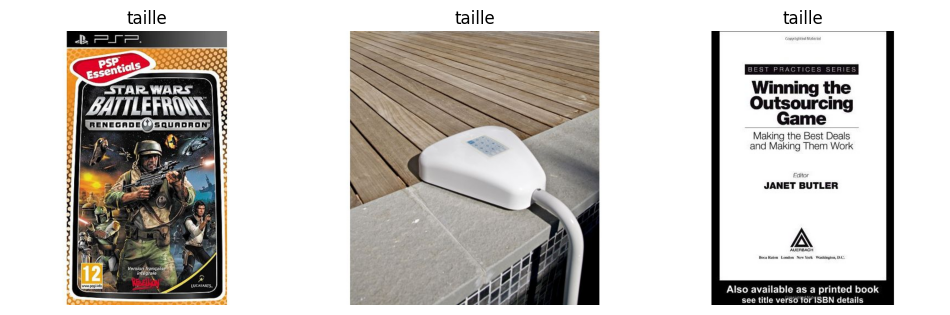

In [39]:
import pandas as pd
from PIL import Image
import os
import cv2
import time
import random

temps_debut = time.time()

# Spécification des chemins des fichiers CSV et images
chemin_x_train = r'C:\Users\pc\Documents\Data Scientist\Rakuten_true\X_train_update.csv'
chemin_y_train = r'C:\Users\pc\Documents\Data Scientist\Rakuten_true\Y_train_CVw08PX.csv'
chemin_x_test = r'C:\Users\pc\Documents\Data Scientist\Rakuten_true\X_test_update.csv'
chemin_images = r'C:\Users\pc\Documents\Data Scientist\Rakuten_true\images\image_train'

x_train = pd.read_csv(chemin_x_train, index_col='Unnamed: 0')
y_train = pd.read_csv(chemin_y_train, index_col='Unnamed: 0')
x_test = pd.read_csv(chemin_x_test, index_col='Unnamed: 0')

x_train['productid'] = x_train['productid'].astype(str)
x_train['imageid'] = x_train['imageid'].astype(str)

nombre_images_a_lire = 1000

# Sélection aléatoire de 1000 images
images_selectionnees = random.sample(os.listdir(chemin_images), nombre_images_a_lire)
images_selectionnees2 = os.listdir(chemin_images)

# Seuil pour détecter le blanc (vous pouvez ajuster cette valeur en fonction de vos besoins)
seuil_blanc = 240

# Liste pour stocker les dimensions des images sans le pourtour blanc
dimensions_images = []

# Démarrer le compteur de temps
temps_debut = time.time()

# Parcourir les fichiers sélectionnés aléatoirement
for nom_fichier in images_selectionnees:
    chemin_image = os.path.join(chemin_images, nom_fichier)
    imageid = nom_fichier.split("_")[1]
    productid = nom_fichier.split("_")[3].split(".")[0] 
    
    # Charger l'image en niveaux de gris
    image = cv2.imread(chemin_image, cv2.IMREAD_GRAYSCALE)
    
    # Trouver les contours de l'image
    contours, _ = cv2.findContours(image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    # Si des contours sont trouvés, déterminer les dimensions de l'image sans le pourtour blanc
    if contours:
        # Trouver les coordonnées du rectangle englobant le plus petit contour
        x, y, largeur_sans_pourtour, hauteur_sans_pourtour = cv2.boundingRect(contours[0])
        # Ajouter les dimensions à la liste
        dimensions_images.append((productid, imageid, largeur_sans_pourtour, hauteur_sans_pourtour))

# Arrêter le compteur de temps
temps_fin = time.time()

# Calculer le temps d'exécution
temps_execution = temps_fin - temps_debut

# Créer un DataFrame à partir de la liste des dimensions
df_dimensions = pd.DataFrame(dimensions_images, columns=['productid','imageid','Largeur', 'Hauteur'])
df_dimensions['Taille'] = df_dimensions['Largeur'].astype(str) + 'x' + df_dimensions['Hauteur'].astype(str)

df_dimensions['productid'] = df_dimensions['productid'].astype(str)
df_dimensions['imageid'] = df_dimensions['imageid'].astype(str)

# Effectuer un value counts sur la combinaison Largeur x Hauteur
occurrences_tailles_images = df_dimensions['Taille'].value_counts()

print("Occurrences de chaque taille d'image :\n", occurrences_tailles_images)
print("Temps d'exécution : {:.2f} secondes".format(temps_execution))

df_jointure = pd.merge(df_dimensions, x_train, on=['productid', 'imageid'])

# Jointure entre le résultat précédent et y_train sur l'index
df_jointure_final = pd.merge(df_jointure, y_train, left_index=True, right_index=True)

# Tableau de contingence entre la taille des images et prdtypecode
tableau_contingence = pd.crosstab(df_jointure_final['Taille'], df_jointure_final['prdtypecode'])

print("Tableau de contingence :\n", tableau_contingence)

# Sélectionner les images dont la taille est différente de 500x500
images_diff_taille = df_jointure_final[df_jointure_final['Taille'].apply(lambda x: int(x.split('x')[0]) <= 3 and int(x.split('x')[1]) <= 3)]
images_a_afficher = images_diff_taille.sample(n=3, random_state=23)
print(images_a_afficher)

fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(12, 10))

# Affichage des images
for i, ax in enumerate(axes.flat):
    # Charger l'image correspondante
    image_path = os.path.join(chemin_images, "image_" + images_a_afficher.iloc[i]['imageid'] + "_product_" + images_a_afficher.iloc[i]['productid'] + ".jpg")
    image = cv2.imread(image_path)
    img_rgb=cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    taille=images_a_afficher['Taille']
    # Afficher l'image
    ax.set_title('taille'.format(taille))
    ax.imshow(img_rgb)
    ax.axis('off')

plt.show()

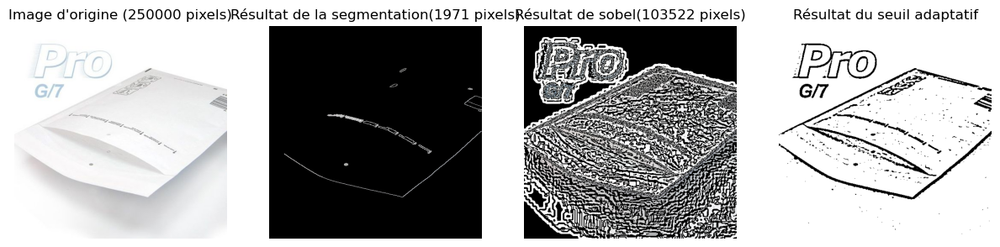

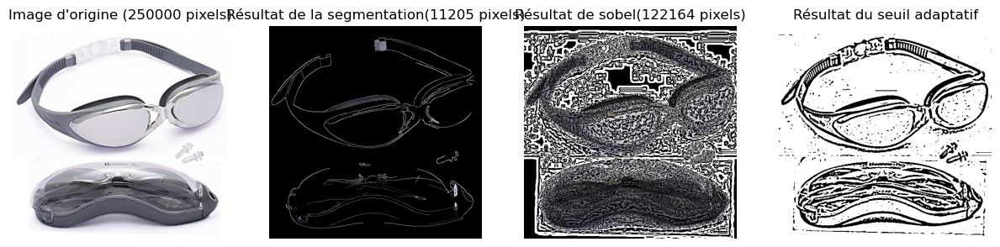

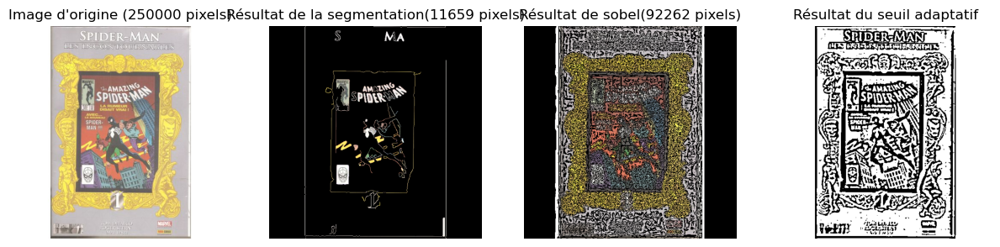

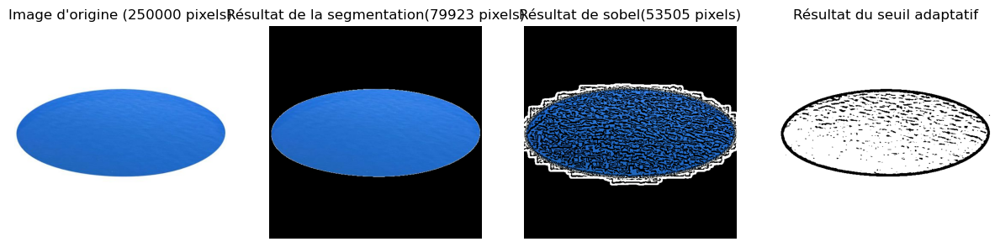

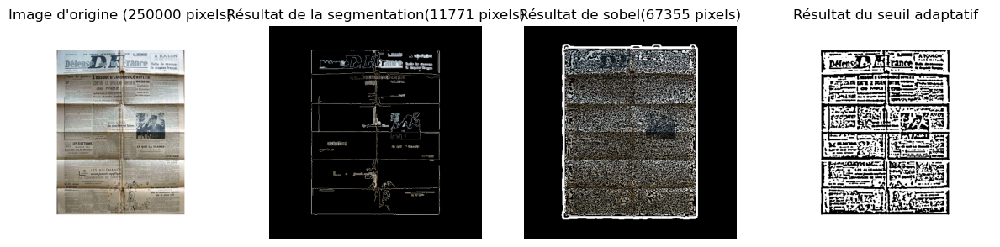

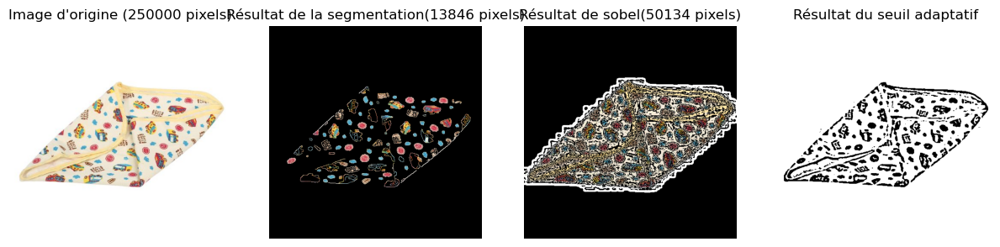

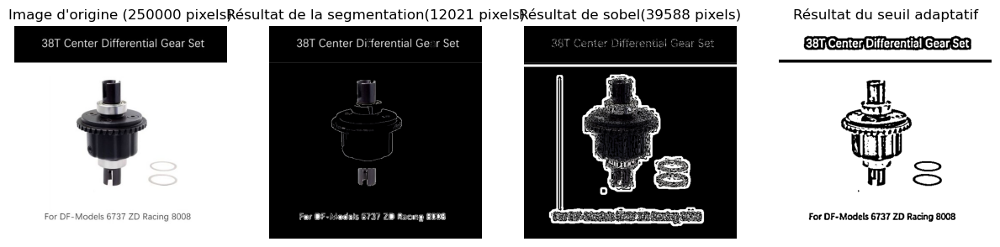

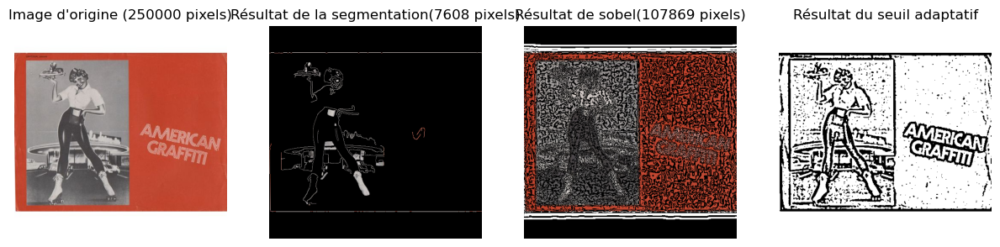

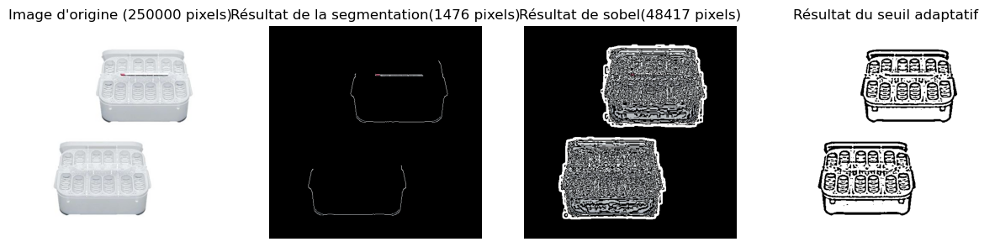

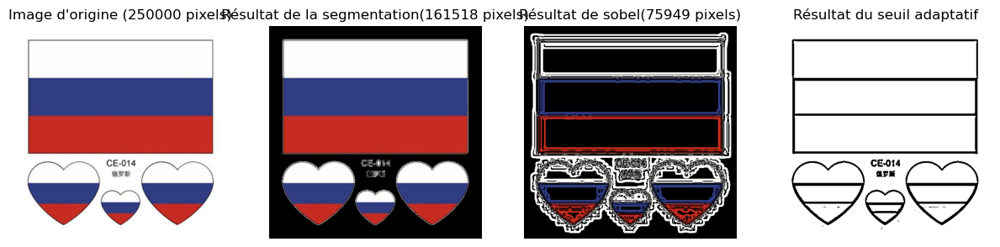

4.022578239440918


In [2]:
import pandas as pd
from PIL import Image
import os
import cv2
import time
import random
import numpy as np
import matplotlib.pyplot as plt

temps_debut = time.time()

# Spécification des chemins des fichiers images
chemin_images = r'C:\Users\pc\Documents\Data Scientist\Rakuten_true\images\image_train'

nombre_images_a_lire = 10

# Sélection aléatoire de X images
images_selectionnees = random.sample(os.listdir(chemin_images), nombre_images_a_lire)
images_selectionnees2 = os.listdir(chemin_images)

# Parcourir les fichiers sélectionnés aléatoirement
for nom_fichier in images_selectionnees:
    chemin_image = os.path.join(chemin_images, nom_fichier)
    imageid = nom_fichier.split("_")[1]
    productid = nom_fichier.split("_")[3].split(".")[0] 
    
    # Charger l'image en niveaux de gris
    image = cv2.imread(chemin_image)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)
    
    
    sobel_x = cv2.Sobel(blurred, cv2.CV_64F, 1, 0, ksize=5)
    sobel_y = cv2.Sobel(blurred, cv2.CV_64F, 0, 1, ksize=5)
    magnitude = np.sqrt(sobel_x**2 + sobel_y**2)

    canny = cv2.Canny(blurred, 70, 255)

    adaptive_thresh = cv2.adaptiveThreshold(magnitude.astype(np.uint8), 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 2)
    adaptive_thresh2 = cv2.adaptiveThreshold(blurred, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 2)
    contours, _ = cv2.findContours(canny, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    mask = np.zeros_like(gray)
    cv2.drawContours(mask, contours, -1, (255), thickness=cv2.FILLED)
    result = cv2.bitwise_and(image, image, mask=mask)
    gray_segmented_image = cv2.cvtColor(result, cv2.COLOR_BGR2GRAY)
    
    mask2 = cv2.bitwise_not(adaptive_thresh)
    # Appliquer le masque à l'image d'origine pour obtenir l'arrière-plan supprimé
    result2 = cv2.bitwise_and(image, image, mask=mask2)
    gray_segmented_image2 = cv2.cvtColor(result2, cv2.COLOR_BGR2GRAY)
    
    nb_pixels_avant = image.shape[0] * image.shape[1]
    nb_pixels_apres = cv2.countNonZero(gray_segmented_image)
    nb_pixels_apres2 = cv2.countNonZero(gray_segmented_image2)
        
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    result_rgb = cv2.cvtColor(result, cv2.COLOR_BGR2RGB)
    result2_rgb= cv2.cvtColor(result2, cv2.COLOR_BGR2RGB)
    adapt_rgb = cv2.cvtColor(adaptive_thresh2, cv2.COLOR_BGR2RGB)
    
    fig, axes = plt.subplots(1, 4, figsize=(15, 10))

    # Afficher l'image d'origine
    axes[0].imshow(image_rgb)
    axes[0].set_title('Image d\'origine ({0} pixels)'.format(nb_pixels_avant))
    axes[0].axis('off')

    # Afficher le résultat
    axes[1].imshow(result_rgb)
    axes[1].set_title('Résultat de la segmentation({0} pixels)'.format(nb_pixels_apres))
    axes[1].axis('off')
    
    # Afficher le résultat
    axes[2].imshow(result2_rgb)
    axes[2].set_title('Résultat de sobel({0} pixels)'.format(nb_pixels_apres2))
    axes[2].axis('off')
    
    # Afficher le résultat
    axes[3].imshow(adapt_rgb)
    axes[3].set_title('Résultat du seuil adaptatif')
    axes[3].axis('off')

    plt.show()
    
# Arrêter le compteur de temps
temps_fin = time.time()

# Calculer le temps d'exécution
temps_execution = temps_fin - temps_debut
print(temps_execution)

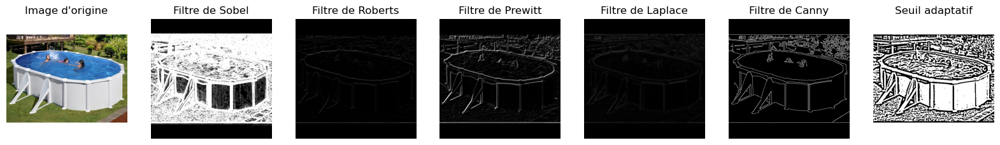

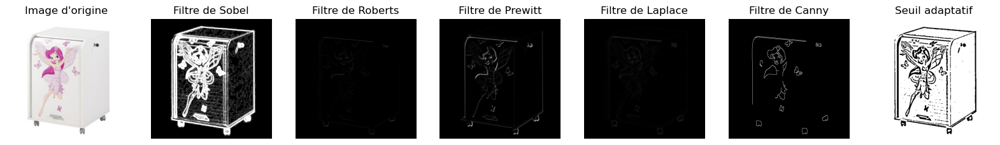

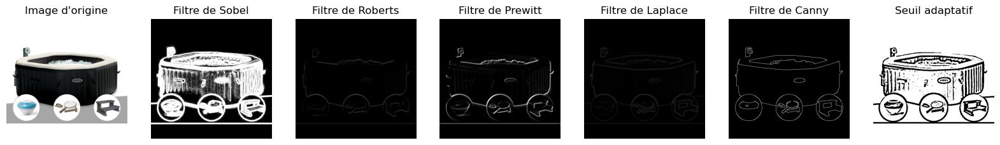

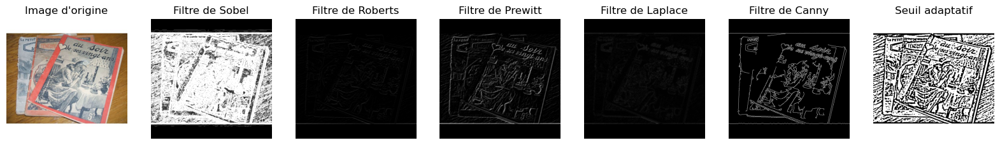

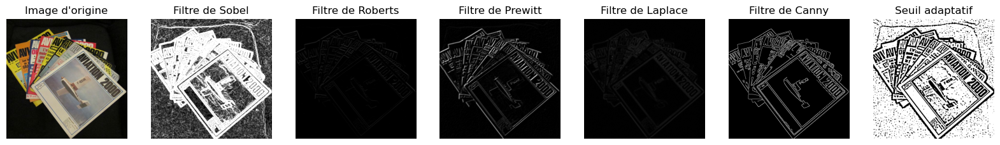

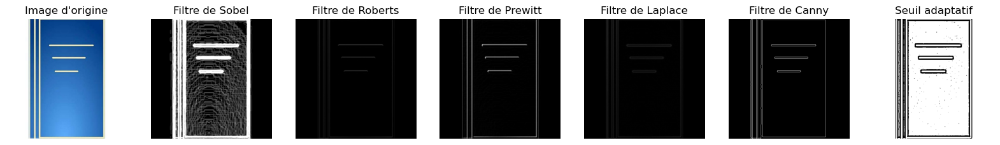

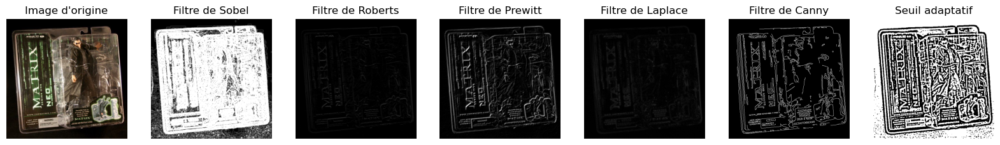

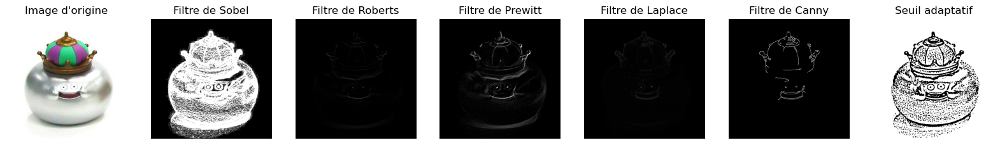

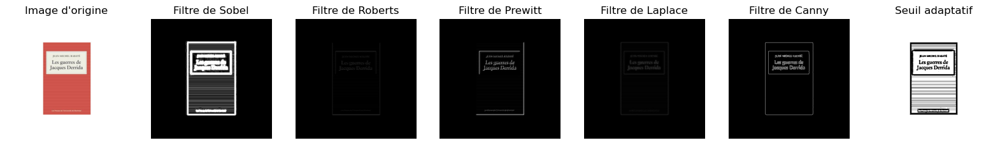

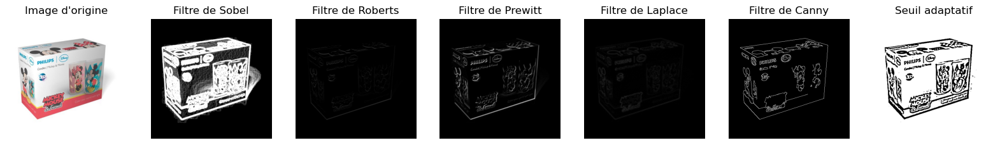

In [6]:
import pandas as pd
import os
import cv2
import random
import numpy as np
import matplotlib.pyplot as plt

# Spécification des chemins des fichiers images
chemin_images = r'C:\Users\pc\Documents\Data Scientist\Rakuten_true\images\image_train'
nombre_images_a_lire = 10

# Sélection aléatoire de X images
images_selectionnees = random.sample(os.listdir(chemin_images), nombre_images_a_lire)

# Parcourir les fichiers sélectionnés aléatoirement
for nom_fichier in images_selectionnees:
    chemin_image = os.path.join(chemin_images, nom_fichier)
    imageid = nom_fichier.split("_")[1]
    productid = nom_fichier.split("_")[3].split(".")[0] 
    
    # Charger l'image en niveaux de gris
    image = cv2.imread(chemin_image)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)

    # Appliquer le filtre de Sobel
    sobel_x = cv2.Sobel(blurred, cv2.CV_64F, 1, 0, ksize=5)
    sobel_y = cv2.Sobel(blurred, cv2.CV_64F, 0, 1, ksize=5)
    sobel = np.sqrt(sobel_x**2 + sobel_y**2)
    sobel_rgb = cv2.cvtColor(cv2.convertScaleAbs(sobel), cv2.COLOR_GRAY2RGB)

    # Appliquer les filtres de Roberts
    roberts_cross_v = cv2.filter2D(blurred, -1, np.array([[-1, 0], [0, 1]]))
    roberts_cross_h = cv2.filter2D(blurred, -1, np.array([[0, -1], [1, 0]]))
    roberts_cross = cv2.addWeighted(roberts_cross_v, 0.5, roberts_cross_h, 0.5, 0)
    roberts_rgb = cv2.cvtColor(cv2.convertScaleAbs(roberts_cross), cv2.COLOR_GRAY2RGB)

    # Appliquer les filtres de Prewitt
    kernelx = cv2.getDerivKernels(1, 0, 3)
    kernely = cv2.getDerivKernels(0, 1, 3)
    prewitt_x = cv2.filter2D(blurred, -1, kernelx[0] * kernelx[1].T)
    prewitt_y = cv2.filter2D(blurred, -1, kernely[0] * kernely[1].T)
    prewitt_cross = cv2.addWeighted(prewitt_x, 0.5, prewitt_y, 0.5, 0)
    prewitt_rgb = cv2.cvtColor(cv2.convertScaleAbs(prewitt_cross), cv2.COLOR_GRAY2RGB)

    # Appliquer le filtre de Laplace
    laplacian = cv2.Laplacian(blurred, cv2.CV_64F)
    laplace_rgb = cv2.cvtColor(cv2.convertScaleAbs(laplacian), cv2.COLOR_GRAY2RGB)

    # Appliquer le filtre de Canny
    edges = cv2.Canny(blurred, 70, 255)
    edges_rgb = cv2.cvtColor(cv2.convertScaleAbs(edges), cv2.COLOR_GRAY2RGB)

    # Appliquer le seuil adaptatif
    adaptive_thresh = cv2.adaptiveThreshold(blurred, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 2)
    adapt_rgb = cv2.cvtColor(cv2.convertScaleAbs(adaptive_thresh), cv2.COLOR_GRAY2RGB)

    # Afficher les images
    fig, axes = plt.subplots(1, 7, figsize=(20, 10))

    # Afficher l'image d'origine
    axes[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axes[0].set_title('Image d\'origine')

    # Afficher le résultat du filtre de Sobel
    axes[1].imshow(sobel_rgb)
    axes[1].set_title('Filtre de Sobel')

    # Afficher le résultat du filtre de Roberts
    axes[2].imshow(roberts_rgb)
    axes[2].set_title('Filtre de Roberts')

    # Afficher le résultat du filtre de Prewitt
    axes[3].imshow(prewitt_rgb)
    axes[3].set_title('Filtre de Prewitt')

    # Afficher le résultat du filtre de Laplace
    axes[4].imshow(laplace_rgb)
    axes[4].set_title('Filtre de Laplace')

    # Afficher le résultat de Canny
    axes[5].imshow(edges_rgb)
    axes[5].set_title('Filtre de Canny')

    # Afficher le résultat du seuil adaptatif
    axes[6].imshow(adapt_rgb)
    axes[6].set_title('Seuil adaptatif')

    # Masquer les axes
    for ax in axes:
        ax.axis('off')

    plt.show()


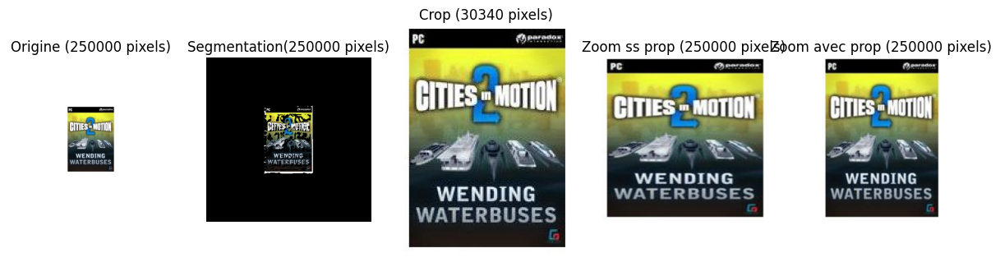

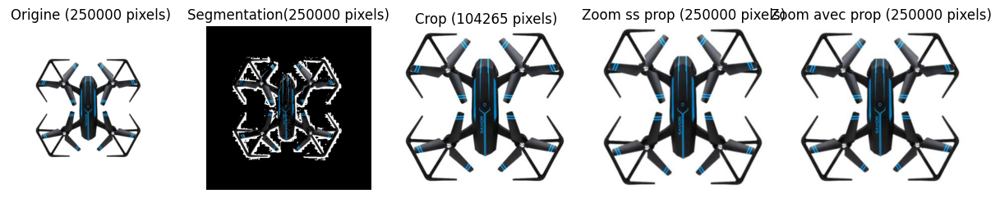

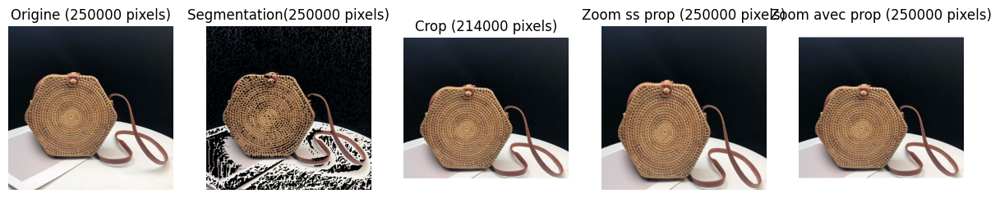

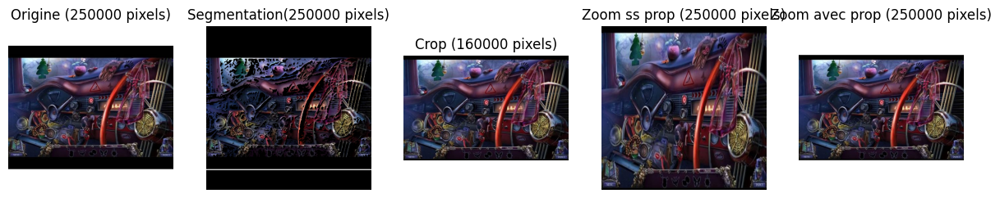

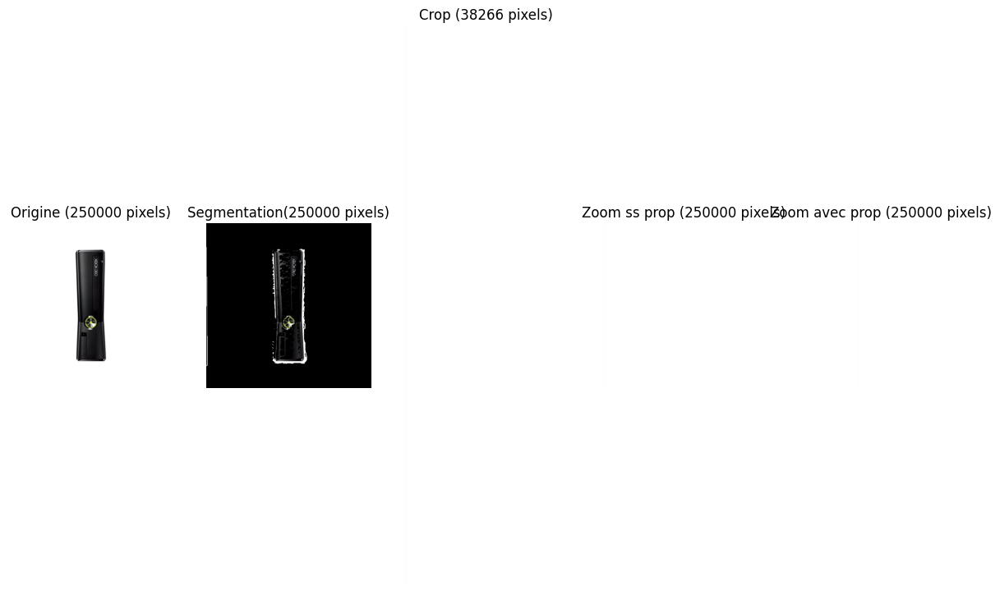

...

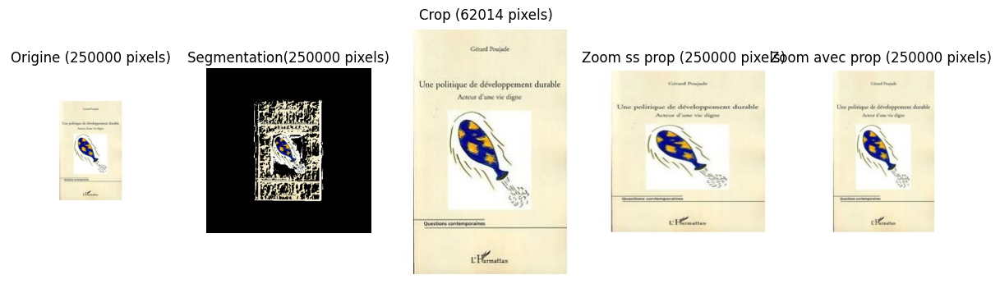

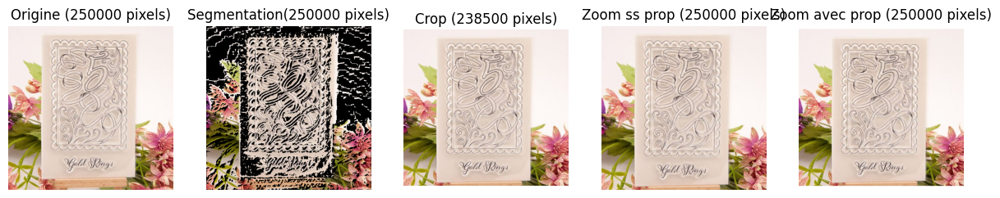

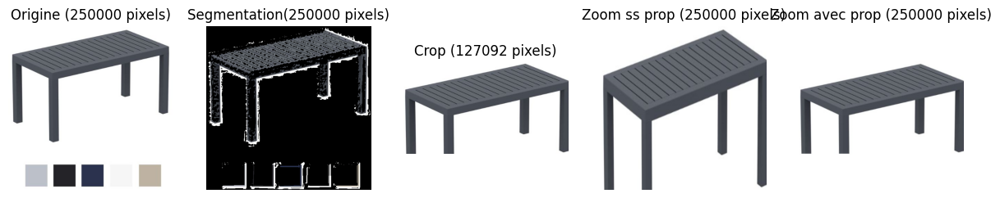

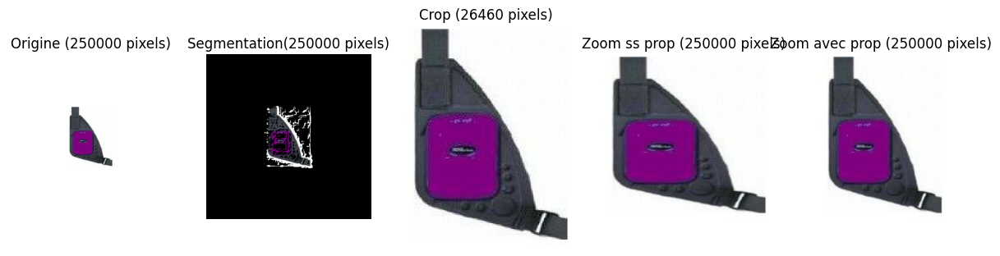

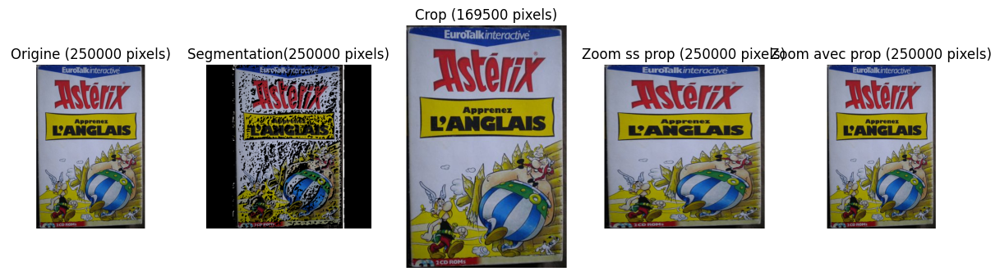

9.068232536315918


In [29]:
import pandas as pd
from PIL import Image
import os
import cv2
import time
import random
import numpy as np
import matplotlib.pyplot as plt

temps_debut = time.time()

# Spécification des chemins des fichiers images
chemin_images = r'C:\Users\pc\Documents\Data Scientist\Rakuten_true\images\image_train'

nombre_images_a_lire = 20

# Sélection aléatoire de X images
images_selectionnees = random.sample(os.listdir(chemin_images), nombre_images_a_lire)
images_selectionnees2 = os.listdir(chemin_images)

donnees=[]

# Parcourir les fichiers sélectionnés aléatoirement
for nom_fichier in images_selectionnees:
    chemin_image = os.path.join(chemin_images, nom_fichier)
    imageid = nom_fichier.split("_")[1]
    productid = nom_fichier.split("_")[3].split(".")[0] 
    
    # Charger l'image en niveaux de gris
    image = cv2.imread(chemin_image)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)
        
    # sobel_x = cv2.Sobel(blurred, cv2.CV_64F, 1, 0, ksize=5)
    # sobel_y = cv2.Sobel(blurred, cv2.CV_64F, 0, 1, ksize=5)
    # sobel_magnitude = np.sqrt(sobel_x**2 + sobel_y**2)
    # sobel_magnitude_gray = cv2.convertScaleAbs(sobel_magnitude)
    # _, sobel_thresholded = cv2.threshold(sobel_magnitude_gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    
    # canny = cv2.Canny(blurred, 70, 255)

    # roberts_cross_v = cv2.filter2D(blurred, -1, np.array([[-1, 0], [0, 1]]))
    # roberts_cross_h = cv2.filter2D(blurred, -1, np.array([[0, -1], [1, 0]]))
    # roberts_cross = cv2.addWeighted(roberts_cross_v, 0.5, roberts_cross_h, 0.5, 0)
    
    kernelx = cv2.getDerivKernels(1, 0, 3)
    kernely = cv2.getDerivKernels(0, 1, 3)
    prewitt_x = cv2.filter2D(blurred, -1, kernelx[0] * kernelx[1].T)
    prewitt_y = cv2.filter2D(blurred, -1, kernely[0] * kernely[1].T)
    prewitt_cross = cv2.addWeighted(prewitt_x, 0.5, prewitt_y, 0.5, 0)
    
    # laplacian = cv2.Laplacian(blurred, cv2.CV_64F)
    # laplacian_gray = cv2.convertScaleAbs(laplacian)
    # _, laplacian_thresholded = cv2.threshold(laplacian_gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # adaptive_thresh = cv2.adaptiveThreshold(blurred, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 2)
    
    contours, _ = cv2.findContours(prewitt_cross, cv2.RETR_TREE, cv2.CHAIN_APPROX_TC89_L1)

    bounding_boxes = []
    for contour in contours:
        # Trouver les coordonnées de la boîte englobante du contour actuel
        x, y, w, h = cv2.boundingRect(contour)
        # Ajouter les coordonnées de la boîte englobante à la liste
        bounding_boxes.append((x, y, w, h))
        
    bounding_boxes_array = np.array(bounding_boxes)
    # Utiliser la fonction min() et max() de numpy pour obtenir les valeurs minimales et maximales
    min_x, min_y, min_w, min_h = np.min(bounding_boxes_array, axis=0)
    max_x, max_y, max_w, max_h = np.max(bounding_boxes_array, axis=0)
    
    # Extraire la région de l'image couverte par la boîte englobante
    cropped_image = image[min_y:min_y+max_h, min_x:min_x+max_w]
    if cropped_image.size == 0:
        print("L'image cropped_image est vide.")
    else:
        # Convertir l'image en niveaux de gris
        gray_cropped_image = cv2.cvtColor(cropped_image, cv2.COLOR_BGR2GRAY)

    # Redimensionner l'image en conservant le ratio d'aspect
    image_redim = cv2.resize(cropped_image, (500, 500))
    
    # Obtenir les dimensions d'origine de l'image cropped_image
    hauteur_origine, largeur_origine = cropped_image.shape[:2]

    # Calculer le ratio de redimensionnement
    ratio = min(500/largeur_origine, 500/hauteur_origine)

    # Appliquer le ratio pour redimensionner l'image tout en conservant les proportions
    image_redim = cv2.resize(cropped_image, None, fx=ratio, fy=ratio)

    # Créer une nouvelle image blanche de taille 500x500
    image_redim2 = np.zeros((500, 500, 3), dtype=np.uint8)
    image_redim2.fill(255)  # Remplir l'image avec du blanc (255)

    # Calculer les coordonnées pour placer l'image redimensionnée au centre de la nouvelle image
    x_offset = (500 - image_redim.shape[1]) // 2
    y_offset = (500 - image_redim.shape[0]) // 2

    # Placer l'image redimensionnée au centre de la nouvelle image
    image_redim2[y_offset:y_offset+image_redim.shape[0], x_offset:x_offset+image_redim.shape[1]] = image_redim

    image_redim = cv2.resize(cropped_image, (500, 500))
    mask = np.zeros_like(gray)
    cv2.drawContours(mask, contours, -1, (255), thickness=cv2.FILLED)
    result = cv2.bitwise_and(image, image, mask=mask)
    gray_segmented_image = cv2.cvtColor(result, cv2.COLOR_BGR2GRAY)
    gray_image_redim = cv2.cvtColor(image_redim, cv2.COLOR_BGR2GRAY)
    gray_image_redim2 = cv2.cvtColor(image_redim2, cv2.COLOR_BGR2GRAY)
   
    nb_pixels_avant = image.shape[0] * image.shape[1]
    nb_pixels_apres = gray_segmented_image.shape[0] * gray_segmented_image.shape[1]
    nb_pixels_apres2 = gray_cropped_image.shape[0] * gray_cropped_image.shape[1]
    nb_pixels_apres3 = gray_image_redim.shape[0] * gray_image_redim.shape[1]
    nb_pixels_apres4 = gray_image_redim2.shape[0] * gray_image_redim2.shape[1]
        
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    result_rgb = cv2.cvtColor(result, cv2.COLOR_BGR2RGB)
    crop_rgb=cv2.cvtColor(cropped_image, cv2.COLOR_BGR2RGB)
    image_redim_rgb = cv2.cvtColor(image_redim, cv2.COLOR_BGR2RGB)
    image_redim2_rgb = cv2.cvtColor(image_redim2, cv2.COLOR_BGR2RGB)
    
    fig, axes = plt.subplots(1, 5, figsize=(15, 10))

    # Afficher l'image d'origine
    axes[0].imshow(image_rgb)
    axes[0].set_title('Origine ({0} pixels)'.format(nb_pixels_avant))
    axes[0].axis('off')

    # Afficher l'image segmentée 
    axes[1].imshow(result_rgb)
    axes[1].set_title('Segmentation({0} pixels)'.format(nb_pixels_apres))
    axes[1].axis('off')
    
    # Afficher l'image redimensionnée
    axes[2].imshow(crop_rgb)
    axes[2].set_title('Crop ({0} pixels)'.format(nb_pixels_apres2))
    axes[2].axis('off')
    
    # Afficher l'image zoomée
    axes[3].imshow(image_redim_rgb)
    axes[3].set_title('Zoom ss prop ({0} pixels)'.format(nb_pixels_apres3))
    axes[3].axis('off')
    
    # Afficher l'image zoomée en conservant les proportions
    axes[4].imshow(image_redim2_rgb)
    axes[4].set_title('Zoom avec prop ({0} pixels)'.format(nb_pixels_apres4))
    axes[4].axis('off')
    
    plt.show()
     
# Arrêter le compteur de temps
temps_fin = time.time()

# Calculer le temps d'exécution
temps_execution = temps_fin - temps_debut
print(temps_execution)

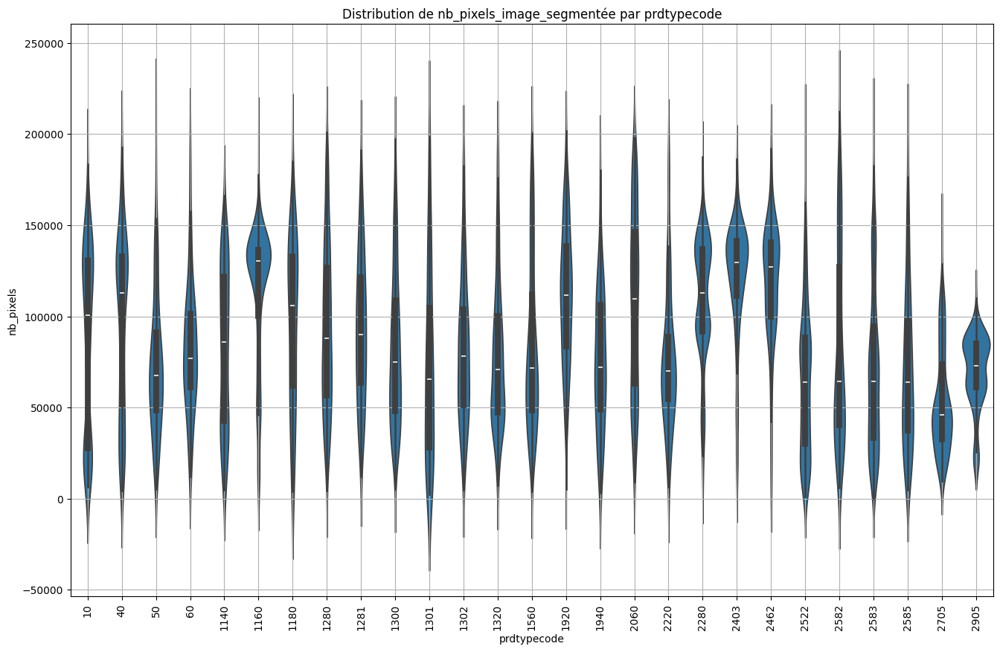

Kruskal-Wallis seg:               Source  ddof1            H  p-unc
Kruskal  prdtypecode     26  1641.066554    0.0


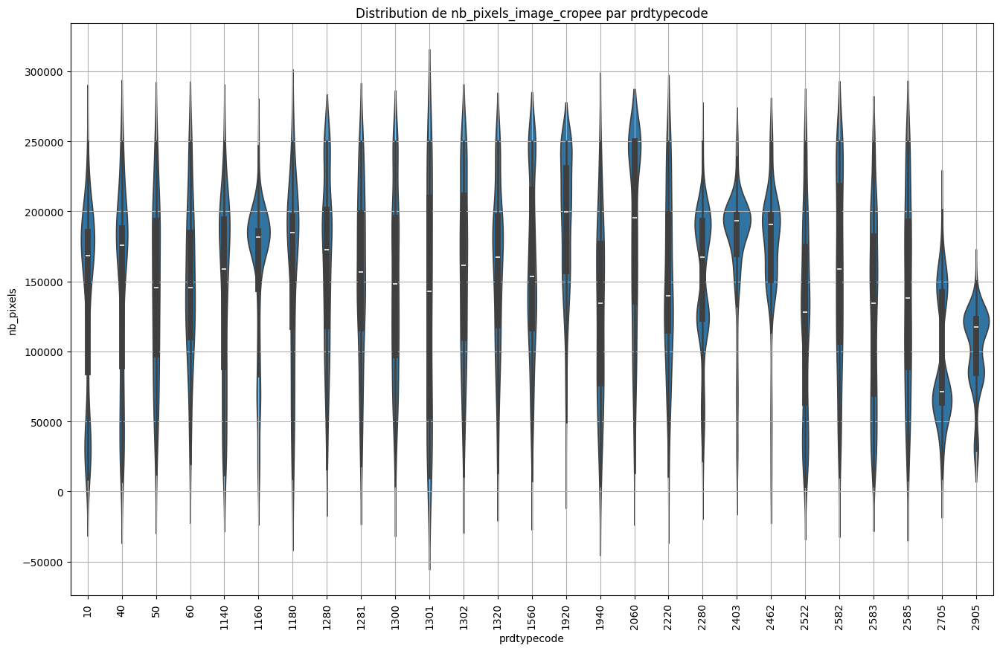

Kruskal-Wallis crop:               Source  ddof1            H          p-unc
Kruskal  prdtypecode     26  1178.728285  4.126587e-232


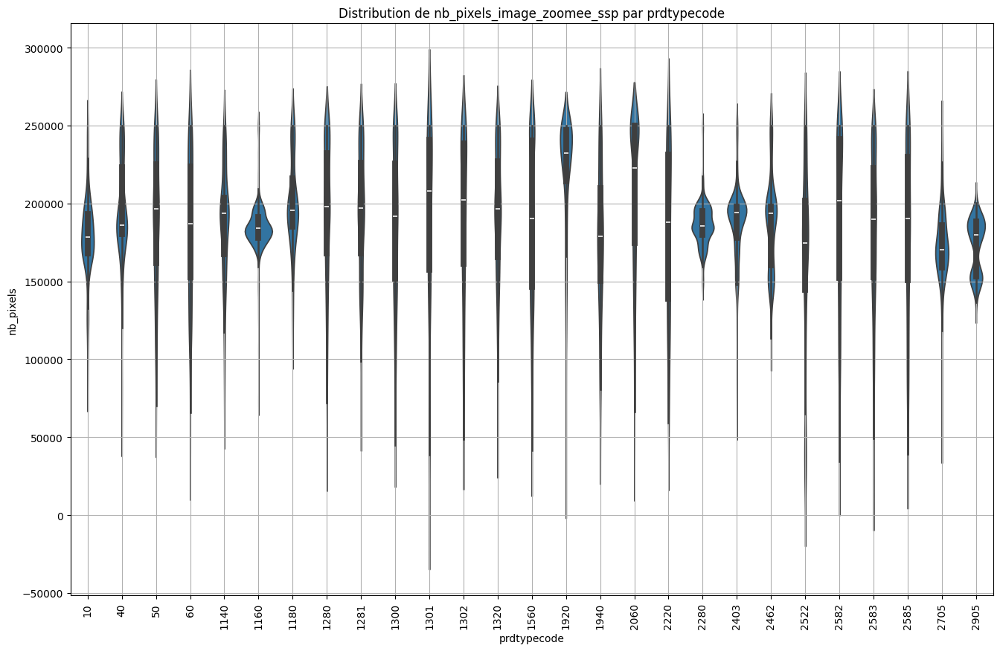

Kruskal-Wallis zoom:               Source  ddof1           H          p-unc
Kruskal  prdtypecode     26  770.183875  1.308712e-145
944.0502834320068


In [21]:
import pandas as pd
from PIL import Image
import os
import cv2
import time
import random
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pingouin as pg

temps_debut = time.time()

# Spécification des chemins des fichiers CSV et images
chemin_x_train = r'C:\Users\pc\Documents\Data Scientist\Rakuten_true\X_train_update.csv'
chemin_y_train = r'C:\Users\pc\Documents\Data Scientist\Rakuten_true\Y_train_CVw08PX.csv'
chemin_x_test = r'C:\Users\pc\Documents\Data Scientist\Rakuten_true\X_test_update.csv'

x_train = pd.read_csv(chemin_x_train, index_col='Unnamed: 0')
y_train = pd.read_csv(chemin_y_train, index_col='Unnamed: 0')

# Spécification des chemins des fichiers images
chemin_images = r'C:\Users\pc\Documents\Data Scientist\Rakuten_true\images\image_train'

nombre_images_a_lire = 30000
# Sélection aléatoire de X images
images_selectionnees = random.sample(os.listdir(chemin_images), nombre_images_a_lire)

#images_selectionnees = os.listdir(chemin_images)

# Filtrer les images pour ne garder que celles de taille 500x500
images_500x500 = []
for image_name in images_selectionnees:
    # Chemin complet de l'image
    chemin_image = os.path.join(chemin_images, image_name)
    
    # Charger l'image en niveaux de gris
    image = cv2.imread(chemin_image, cv2.IMREAD_GRAYSCALE)
    
    # Trouver les contours de l'image
    contours, _ = cv2.findContours(image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    # Si des contours sont trouvés, déterminer les dimensions de l'image sans le contour blanc
    if contours:
        # Trouver les coordonnées du rectangle englobant le plus petit contour
        x, y, largeur_sans_pourtour, hauteur_sans_pourtour = cv2.boundingRect(contours[0])
        
        # Vérifier si les dimensions correspondent à 500x500 pixels
        if largeur_sans_pourtour == 500 and hauteur_sans_pourtour == 500:
            # Ajouter le nom de l'image à la liste des images 500x500
            images_500x500.append(image_name)

images_selectionnees = images_500x500

donnees=[]

# Parcourir les fichiers sélectionnés aléatoirement
for nom_fichier in images_selectionnees:
    chemin_image = os.path.join(chemin_images, nom_fichier)
    imageid = nom_fichier.split("_")[1]
    productid = nom_fichier.split("_")[3].split(".")[0] 
    
    # Charger l'image en niveaux de gris
    image = cv2.imread(chemin_image)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)
        
    # sobel_x = cv2.Sobel(blurred, cv2.CV_64F, 1, 0, ksize=5)
    # sobel_y = cv2.Sobel(blurred, cv2.CV_64F, 0, 1, ksize=5)
    # sobel_magnitude = np.sqrt(sobel_x**2 + sobel_y**2)
    # sobel_magnitude_gray = cv2.convertScaleAbs(sobel_magnitude)
    # _, sobel_thresholded = cv2.threshold(sobel_magnitude_gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    
    # canny = cv2.Canny(blurred, 70, 255)

    # roberts_cross_v = cv2.filter2D(blurred, -1, np.array([[-1, 0], [0, 1]]))
    # roberts_cross_h = cv2.filter2D(blurred, -1, np.array([[0, -1], [1, 0]]))
    # roberts_cross = cv2.addWeighted(roberts_cross_v, 0.5, roberts_cross_h, 0.5, 0)
    
    kernelx = cv2.getDerivKernels(1, 0, 3)
    kernely = cv2.getDerivKernels(0, 1, 3)
    prewitt_x = cv2.filter2D(blurred, -1, kernelx[0] * kernelx[1].T)
    prewitt_y = cv2.filter2D(blurred, -1, kernely[0] * kernely[1].T)
    prewitt_cross = cv2.addWeighted(prewitt_x, 0.5, prewitt_y, 0.5, 0)
    
    # laplacian = cv2.Laplacian(blurred, cv2.CV_64F)
    # laplacian_gray = cv2.convertScaleAbs(laplacian)
    # _, laplacian_thresholded = cv2.threshold(laplacian_gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # adaptive_thresh = cv2.adaptiveThreshold(blurred, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 2)
    
    contours, _ = cv2.findContours(prewitt_cross, cv2.RETR_TREE, cv2.CHAIN_APPROX_TC89_L1)

    bounding_boxes = []
    for contour in contours:
        # Trouver les coordonnées de la boîte englobante du contour actuel
        x, y, w, h = cv2.boundingRect(contour)
        # Ajouter les coordonnées de la boîte englobante à la liste
        bounding_boxes.append((x, y, w, h))
        
    bounding_boxes_array = np.array(bounding_boxes)
    # Utiliser la fonction min() et max() de numpy pour obtenir les valeurs minimales et maximales
    if bounding_boxes_array.size != 0:
        # Utiliser la fonction min() et max() de numpy pour obtenir les valeurs minimales et maximales
        min_x, min_y, min_w, min_h = np.min(bounding_boxes_array, axis=0)
        max_x, max_y, max_w, max_h = np.max(bounding_boxes_array, axis=0)
    else:
        # Gérer le cas où bounding_boxes_array est vide
        min_x, min_y, min_w, min_h = 0, 0, 0, 0
        max_x, max_y, max_w, max_h = 500, 500, 500, 500
    
    # Extraire la région de l'image couverte par la boîte englobante
    cropped_image = image[min_y:min_y+max_h, min_x:min_x+max_w]
    if cropped_image.size == 0:
        print("L'image cropped_image est vide.")
    else:
        # Convertir l'image en niveaux de gris
        gray_cropped_image = cv2.cvtColor(cropped_image, cv2.COLOR_BGR2GRAY)

    # Redimensionner l'image en conservant le ratio d'aspect
    image_redim = cv2.resize(cropped_image, (500, 500))
    
    # Obtenir les dimensions d'origine de l'image cropped_image
    hauteur_origine, largeur_origine = cropped_image.shape[:2]

    # Calculer le ratio de redimensionnement
    ratio = min(500/largeur_origine, 500/hauteur_origine)

    # Appliquer le ratio pour redimensionner l'image tout en conservant les proportions
    image_redim = cv2.resize(cropped_image, None, fx=ratio, fy=ratio)

    # Créer une nouvelle image blanche de taille 500x500
    image_redim2 = np.zeros((500, 500, 3), dtype=np.uint8)
    image_redim2.fill(255)  # Remplir l'image avec du blanc (255)

    # Calculer les coordonnées pour placer l'image redimensionnée au centre de la nouvelle image
    x_offset = (500 - image_redim.shape[1]) // 2
    y_offset = (500 - image_redim.shape[0]) // 2

    # Placer l'image redimensionnée au centre de la nouvelle image
    image_redim2[y_offset:y_offset+image_redim.shape[0], x_offset:x_offset+image_redim.shape[1]] = image_redim
    
    mask = np.zeros_like(gray)
    cv2.drawContours(mask, contours, -1, (255), thickness=cv2.FILLED)
    result = cv2.bitwise_and(image, image, mask=mask)
    gray_segmented_image = cv2.cvtColor(result, cv2.COLOR_BGR2GRAY)
    gray_image_redim = cv2.cvtColor(image_redim, cv2.COLOR_BGR2GRAY)
    gray_image_redim2 = cv2.cvtColor(image_redim2, cv2.COLOR_BGR2GRAY)
   
    nb_pixels_avant = image.shape[0] * image.shape[1]
    nb_pixels_apres = cv2.countNonZero(gray_segmented_image)
    nb_pixels_apres2 = cv2.countNonZero(gray_cropped_image)
    nb_pixels_apres3 = cv2.countNonZero(gray_image_redim)
    nb_pixels_apres4 = cv2.countNonZero(gray_image_redim2)
        
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    result_rgb = cv2.cvtColor(result, cv2.COLOR_BGR2RGB)
    crop_rgb=cv2.cvtColor(cropped_image, cv2.COLOR_BGR2RGB)
    image_redim_rgb = cv2.cvtColor(image_redim, cv2.COLOR_BGR2RGB)
    image_redim2_rgb = cv2.cvtColor(image_redim2, cv2.COLOR_BGR2RGB)
    
    # Ajouter les données à la liste
    donnees.append({
        'imageid': imageid,
        'productid': productid,
        'nb_pixels_origine': nb_pixels_avant,
        'nb_pixels_segmentee': nb_pixels_apres,
        'nb_pixels_cropee': nb_pixels_apres2,
        'nb_pixels_zoom_no_proportions': nb_pixels_apres3,
        'nb_pixels_zoom_with_proportions': nb_pixels_apres4
    })

# Créer un DataFrame à partir des données
df_images = pd.DataFrame(donnees)

df_images['productid'] = df_images['productid'].astype(str)
df_images['imageid'] = df_images['imageid'].astype(str)

x_train['productid'] = x_train['productid'].astype(str)
x_train['imageid'] = x_train['imageid'].astype(str)

df_jointure1 = pd.merge(x_train, y_train, left_index=True, right_index=True)
df_jointure2 = pd.merge(df_images, df_jointure1, on=['productid', 'imageid'])

# Créer un violin plot 
plt.figure(figsize=(16, 10))
sns.violinplot(x='prdtypecode', y='nb_pixels_segmentee', data=df_jointure2)
plt.title('Distribution de nb_pixels_image_segmentée par prdtypecode')
plt.xlabel('prdtypecode')
plt.ylabel('nb_pixels')
plt.xticks(rotation=90)
plt.grid(True)
plt.show()

kruskal_result = pg.kruskal(data=df_jointure2, dv='nb_pixels_segmentee', between='prdtypecode')
print("Kruskal-Wallis seg:", kruskal_result)


# Créer un violin plot 
plt.figure(figsize=(16, 10))
sns.violinplot(x='prdtypecode', y='nb_pixels_cropee', data=df_jointure2)
plt.title('Distribution de nb_pixels_image_cropee par prdtypecode')
plt.xlabel('prdtypecode')
plt.ylabel('nb_pixels')
plt.xticks(rotation=90)
plt.grid(True)
plt.show()

kruskal_result = pg.kruskal(data=df_jointure2, dv='nb_pixels_cropee', between='prdtypecode')
print("Kruskal-Wallis crop:", kruskal_result)

# Créer un violin plot 
plt.figure(figsize=(16, 10))
sns.violinplot(x='prdtypecode', y='nb_pixels_zoom_no_proportions', data=df_jointure2)
plt.title('Distribution de nb_pixels_image_zoomee_ssp par prdtypecode')
plt.xlabel('prdtypecode')
plt.ylabel('nb_pixels')
plt.xticks(rotation=90)
plt.grid(True)
plt.show()

kruskal_result = pg.kruskal(data=df_jointure2, dv='nb_pixels_zoom_no_proportions', between='prdtypecode')
print("Kruskal-Wallis zoom:", kruskal_result)


# Compteur de temps
temps_fin = time.time()
temps_execution = temps_fin - temps_debut
print(temps_execution)

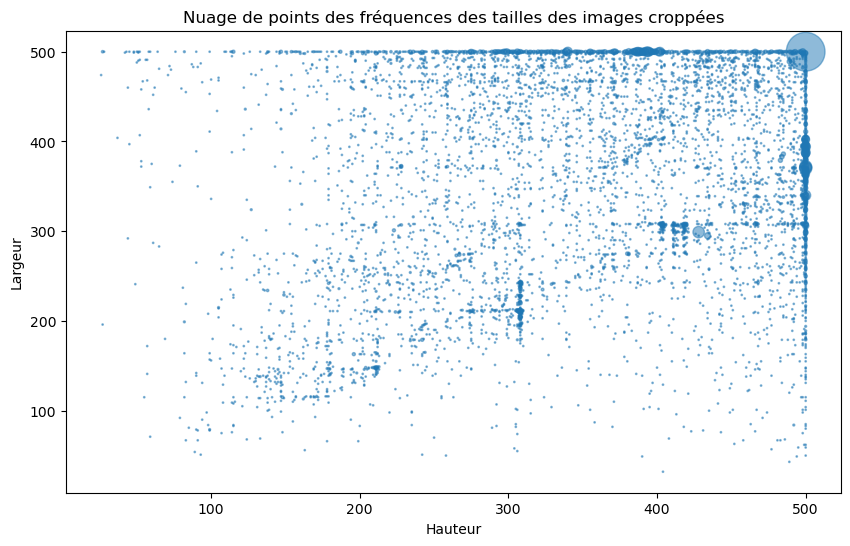

In [122]:
hauteurs = [len(image) for image in df['crop_rgb']]
largeurs = [len(image[0]) for image in df['crop_rgb']]

df_dimensions = pd.DataFrame({'Hauteur': hauteurs, 'Largeur': largeurs})

# Obtenir les fréquences de chaque dimension
frequences = df_dimensions.groupby(['Hauteur', 'Largeur']).size().reset_index(name='Fréquence')

# Tracer le nuage de points des fréquences
plt.figure(figsize=(10, 6))
plt.scatter(frequences['Hauteur'], frequences['Largeur'], s=frequences['Fréquence'], alpha=0.5)
plt.title("Nuage de points des fréquences des tailles des images croppées")
plt.xlabel('Hauteur')
plt.ylabel('Largeur')
plt.show()

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import cv2
import time
import random
from sklearn.decomposition import PCA
from PIL import Image

temps_debut = time.time()

# Chemins des fichiers CSV et images
chemin_x_train = r'C:\Users\pc\Documents\Data Scientist\Rakuten_true\X_train_update.csv'
chemin_y_train = r'C:\Users\pc\Documents\Data Scientist\Rakuten_true\Y_train_CVw08PX.csv'
chemin_images = r'C:\Users\pc\Documents\Data Scientist\Rakuten_true\images\image_train'

x_train = pd.read_csv(chemin_x_train, index_col='Unnamed: 0')
y_train = pd.read_csv(chemin_y_train, index_col='Unnamed: 0')

nombre_images_a_lire = 30000
largeur_im=250
hauteur_im=250

# Sélection aléatoire de X images
images_selectionnees1 = random.sample(os.listdir(chemin_images), nombre_images_a_lire)

#images_selectionnees1 = os.listdir(chemin_images)

# Filtrer les images pour ne garder que celles de taille 500x500
images_500x500 = []
for image_name in images_selectionnees1:
    # Chemin complet de l'image
    chemin_image = os.path.join(chemin_images, image_name)
    
    # Charger l'image en niveaux de gris
    image = cv2.imread(chemin_image, cv2.IMREAD_GRAYSCALE)
    
    # Trouver les contours de l'image
    contours, _ = cv2.findContours(image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    # Si des contours sont trouvés, déterminer les dimensions de l'image sans le contour blanc
    if contours:
        # Trouver les coordonnées du rectangle englobant le plus petit contour
        x, y, largeur_sans_pourtour, hauteur_sans_pourtour = cv2.boundingRect(contours[0])
        
        # Vérifier si les dimensions correspondent à 500x500 pixels
        if largeur_sans_pourtour == 500 and hauteur_sans_pourtour == 500:
            # Ajouter le nom de l'image à la liste des images 500x500
            images_500x500.append(image_name)

images_selectionnees = images_500x500

donnees=[]

# Parcourir les fichiers sélectionnés aléatoirement
for nom_fichier in images_selectionnees:
    chemin_image = os.path.join(chemin_images, nom_fichier)
    imageid = nom_fichier.split("_")[1]
    productid = nom_fichier.split("_")[3].split(".")[0] 
    
    # Charger l'image en niveaux de gris
    image = cv2.imread(chemin_image)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)

    kernelx = cv2.getDerivKernels(1, 0, 3)
    kernely = cv2.getDerivKernels(0, 1, 3)
    prewitt_x = cv2.filter2D(blurred, -1, kernelx[0] * kernelx[1].T)
    prewitt_y = cv2.filter2D(blurred, -1, kernely[0] * kernely[1].T)
    prewitt_cross = cv2.addWeighted(prewitt_x, 0.5, prewitt_y, 0.5, 0)
    
    contours, _ = cv2.findContours(prewitt_cross, cv2.RETR_TREE, cv2.CHAIN_APPROX_TC89_L1)

    bounding_boxes = []
    for contour in contours:
        # Trouver les coordonnées de la boîte englobante du contour actuel
        x, y, w, h = cv2.boundingRect(contour)
        # Ajouter les coordonnées de la boîte englobante à la liste
        bounding_boxes.append((x, y, w, h))

    if bounding_boxes:
        bounding_boxes_array = np.array(bounding_boxes)
        min_x, min_y, min_w, min_h = np.min(bounding_boxes_array, axis=0)
        max_x, max_y, max_w, max_h = np.max(bounding_boxes_array, axis=0)
    else:
        # Gérer le cas où bounding_boxes est vide
        min_x, min_y, min_w, min_h = 0, 0, 0, 0
        max_x, max_y, max_w, max_h = 500, 500, 500, 500

    # Extraire la région de l'image couverte par la boîte englobante
    cropped_image = image[min_y:min_y+max_h, min_x:min_x+max_w]
    if cropped_image.size == 0:
        print("L'image cropped_image est vide.")
    else:
        # Convertir l'image en niveaux de gris
        gray_cropped_image = cv2.cvtColor(cropped_image, cv2.COLOR_BGR2GRAY)

    # Redimensionner l'image sans conserver le ratio d'aspect
    image_redim = cv2.resize(cropped_image, (largeur_im, hauteur_im))
    image_redim_rgb = cv2.cvtColor(image_redim, cv2.COLOR_BGR2RGB)
    gray_image_redim = cv2.cvtColor(image_redim, cv2.COLOR_BGR2GRAY)

    pixels_image_redim = gray_image_redim.flatten().tolist()

    # Vérifier si le nombre de pixels correspond à 2500
    nb_pixels = len(pixels_image_redim)
    if nb_pixels != largeur_im * hauteur_im:
        print(f"L'image {nom_fichier} ne contient pas le bon nombre de pixels.")
    else:
        # Ajouter les données à la liste
        donnees.append({
            'imageid': imageid,
            'productid': productid,
            'features': pixels_image_redim,
        })

colonnes = ['imageid', 'productid', 'features']
df_images = pd.DataFrame(donnees, columns=colonnes)
df_images['productid'] = df_images['productid'].astype(str)
df_images['imageid'] = df_images['imageid'].astype(str)

x_train['productid'] = x_train['productid'].astype(str)
x_train['imageid'] = x_train['imageid'].astype(str)

df_jointure1 = pd.merge(x_train, y_train, left_index=True, right_index=True)
df_jointure2 = pd.merge(df_images, df_jointure1, on=['productid', 'imageid'])

nb_features_total = largeur_im * hauteur_im
features_df = df_jointure2['features'].apply(lambda x: pd.Series(x))

df_jointure2 = pd.concat([df_jointure2, features_df], axis=1)
df_jointure2.drop(columns=['features'], inplace=True)
df_jointure2.rename(columns={i: f'f{i}' for i in range(nb_features_total)}, inplace=True)

print(df_jointure2)
# Arrêter le compteur de temps
temps_fin = time.time()
temps_execution = temps_fin - temps_debut
print("Temps d'exécution:", temps_execution, "secondes")


         imageid   productid  \
0     1279011785  4037801055   
1     1086094008  1508416186   
2      291309910    17429306   
3     1290769145  4096333961   
4     1296701931  4129169651   
...          ...         ...   
9900  1157599073  2679613377   
9901   934571582   193049915   
9902  1263721425  3782771683   
9903  1285408616  4069002663   
9904  1281927140  4048730102   

                                            designation  \
0     4pc Happy Valentine Oreiller Entoilées Coussin...   
1      Liner sable ou bleu pour piscine allongée Ubbink   
2                 Sapeurs Gobelins - Ere Glaciaire - Vf   
3     Clp Chaise De Salle A Manger Tyler Tissu I Cha...   
4                           Journal Your Life?S Journey   
...                                                 ...   
9900                             Tour De Lit Dalmatiens   
9901  pompe de piscine guinard 650W 14.5m3/h compati...   
9902  Piscine acier aspect pierre Santorini ovale 74...   
9903  Piscine pour enfant